In [1]:
from transformers import pipeline 

modelo = "facebook/detr-resnet-50"
detector = pipeline("object-detection", model=modelo)

/home/lucas/projects/estudos-python/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-08-06 13:25:57.738637: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-06 13:25:57.747043: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-06 13:25:57.763368: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-06 13:25:57.768248: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register fact

In [2]:
from datasets import load_dataset 
dados = load_dataset("shinonomelab/cleanvid-15m_map", streaming=True, split="train")

In [3]:
for linha in dados.take(4):
    print(linha)
    print('*****')

{'id': 1095327279, 'description': "Close-up of a male welder in protective clothing welding metal in a blacksmith's workshop. The process of making a metal fence in a forge.", 'duration': 7.96, 'aspectratio': '16:9', 'videourl': 'https://www.shutterstock.com/shutterstock/videos/1095327279/preview/stock-footage-close-up-of-a-male-welder-in-protective-clothing-welding-metal-in-a-blacksmith-s-workshop-the.mp4', 'author': '{"accountsId": 162697858, "contributorId": 162697858, "bio": "\\u0421\\u0432\\u0430\\u0434\\u0435\\u0431\\u043d\\u044b\\u0439 \\u0438 \\u0441\\u0435\\u043c\\u0435\\u0439\\u043d\\u044b\\u0439 \\u0432\\u0438\\u0434\\u0435\\u043e\\u0433\\u0440\\u0430\\u0444. \\u0417\\u0430\\u043d\\u0438\\u043c\\u0430\\u044e\\u0441\\u044c \\u0432\\u0438\\u0434\\u0435\\u043e\\u0441\\u044a\\u0435\\u043c\\u043a\\u043e\\u0439 \\u0441 2007 \\u0433\\u043e\\u0434\\u0430.", "location": "ua", "website": "-", "contributorTypeList": ["videographer"], "equipmentList": ["Canon 6D", "Canon 50 mm 1.4", "Ca

In [5]:
import cv2 

for linha in dados.take(5):
    captura = cv2.VideoCapture(linha['videourl'])
    fps = int(linha['framerate'])
    sucesso, frame = captura.read() 
    
    frame_count = 0 
    
    while sucesso:
        if frame_count % fps == 0:
            deteccao = detector(frame)
            print(deteccao)
        sucesso, frame = captura.read() 
        frame_count += 1
        
    print('-----')
        

TypeError: Incorrect format used for image. Should be an url linking to an image, a base64 string, a local path, or a PIL image.

In [6]:
frame

array([[[ 67,  79, 110],
        [ 60,  72, 103],
        [ 68,  80, 111],
        ...,
        [ 46,  54,  76],
        [ 54,  62,  84],
        [ 57,  65,  87]],

       [[ 57,  69, 100],
        [ 41,  53,  84],
        [ 46,  58,  89],
        ...,
        [ 59,  67,  89],
        [ 59,  67,  89],
        [ 59,  67,  89]],

       [[ 60,  72, 103],
        [ 68,  80, 111],
        [ 69,  81, 112],
        ...,
        [ 61,  69,  91],
        [ 58,  66,  88],
        [ 60,  68,  90]],

       ...,

       [[ 55,  68, 103],
        [ 58,  71, 106],
        [ 63,  76, 111],
        ...,
        [136, 151, 186],
        [138, 154, 186],
        [139, 155, 187]],

       [[ 57,  70, 105],
        [ 60,  73, 108],
        [ 60,  73, 108],
        ...,
        [132, 154, 188],
        [132, 154, 188],
        [132, 154, 188]],

       [[ 57,  70, 105],
        [ 58,  71, 106],
        [ 57,  70, 105],
        ...,
        [132, 154, 188],
        [130, 152, 186],
        [130, 152, 186]]

In [7]:
import cv2 
from PIL import Image 

def cv2_to_pillow(array):
    array = cv2.cvtColor(array, cv2.COLOR_BGR2RGB)
    return Image.fromarray(array)
    

for linha in dados.take(5):
    captura = cv2.VideoCapture(linha['videourl'])
    fps = int(linha['framerate'])
    sucesso, frame = captura.read()
    frame_count = 0
    while sucesso:
        imagem = cv2_to_pillow(frame)
        if frame_count % fps == 0:
            deteccao = detector(imagem)
            print(deteccao)
        sucesso, frame = captura.read()
        frame_count += 1
    print('-----')

[{'score': 0.8612290024757385, 'label': 'person', 'box': {'xmin': 59, 'ymin': 46, 'xmax': 265, 'ymax': 233}}, {'score': 0.8609126210212708, 'label': 'truck', 'box': {'xmin': 0, 'ymin': 1, 'xmax': 595, 'ymax': 333}}, {'score': 0.8529941439628601, 'label': 'person', 'box': {'xmin': 58, 'ymin': 46, 'xmax': 266, 'ymax': 333}}]
[{'score': 0.9154040217399597, 'label': 'person', 'box': {'xmin': 59, 'ymin': 46, 'xmax': 271, 'ymax': 231}}, {'score': 0.8199201822280884, 'label': 'bench', 'box': {'xmin': 247, 'ymin': 48, 'xmax': 595, 'ymax': 152}}, {'score': 0.9223228096961975, 'label': 'person', 'box': {'xmin': 58, 'ymin': 46, 'xmax': 271, 'ymax': 333}}, {'score': 0.7573913931846619, 'label': 'bench', 'box': {'xmin': 262, 'ymin': 111, 'xmax': 596, 'ymax': 198}}, {'score': 0.5632667541503906, 'label': 'bench', 'box': {'xmin': 353, 'ymin': 253, 'xmax': 595, 'ymax': 335}}, {'score': 0.503654420375824, 'label': 'bench', 'box': {'xmin': 0, 'ymin': 220, 'xmax': 595, 'ymax': 333}}, {'score': 0.58851784

Detectando objetos no vídeo: https://www.shutterstock.com/shutterstock/videos/1079808617/preview/stock-footage-portrait-shot-of-caucasian-woman-wearing-protective-mask-standing-outdoor-in-forest-looking-at-the.mp4


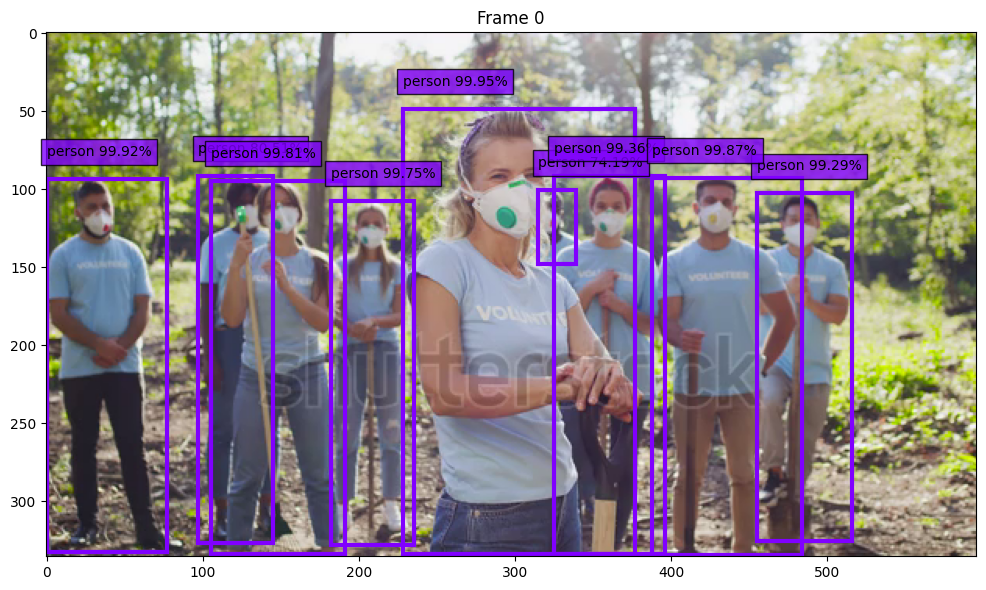

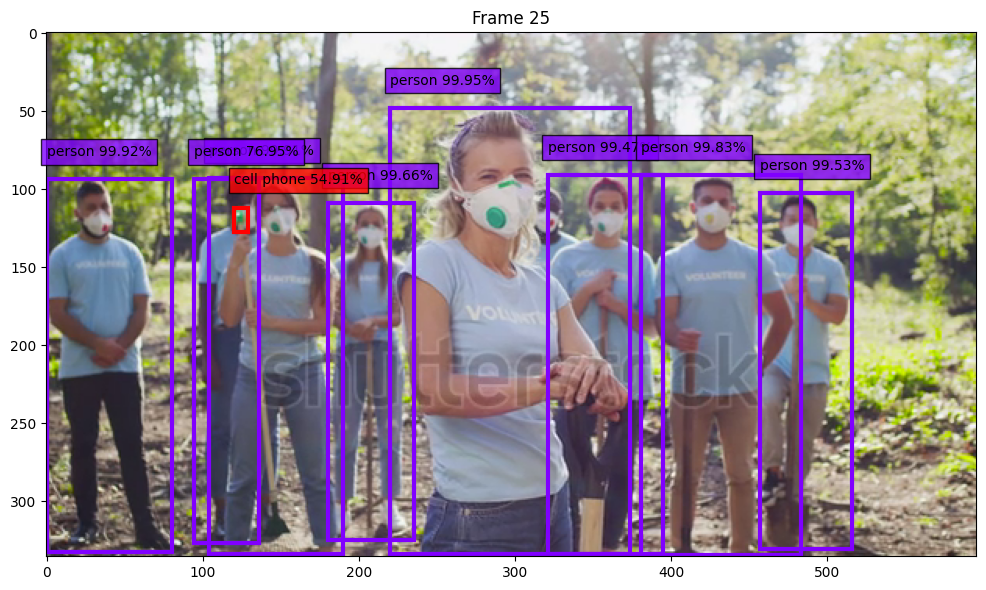

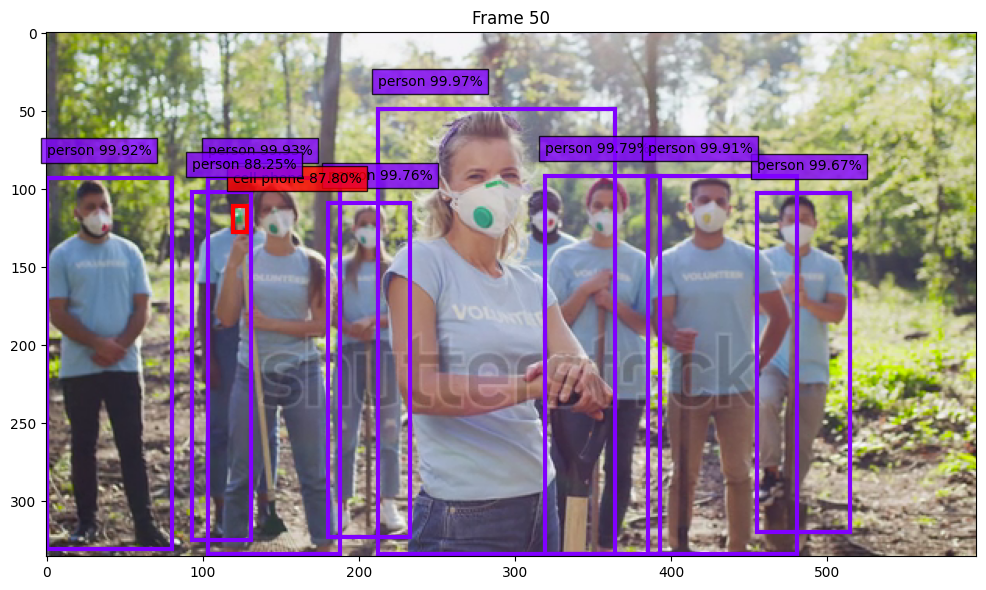

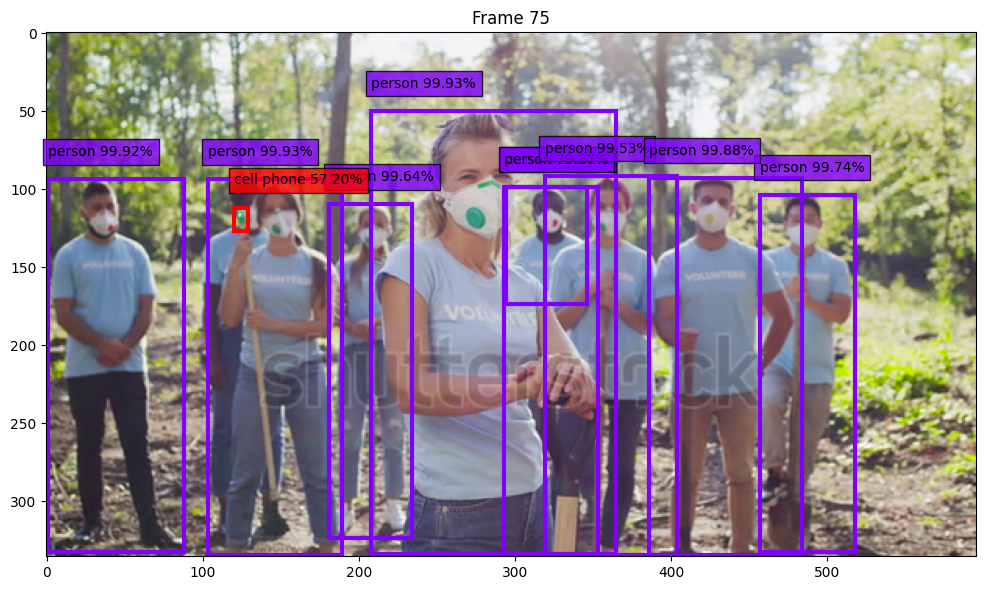

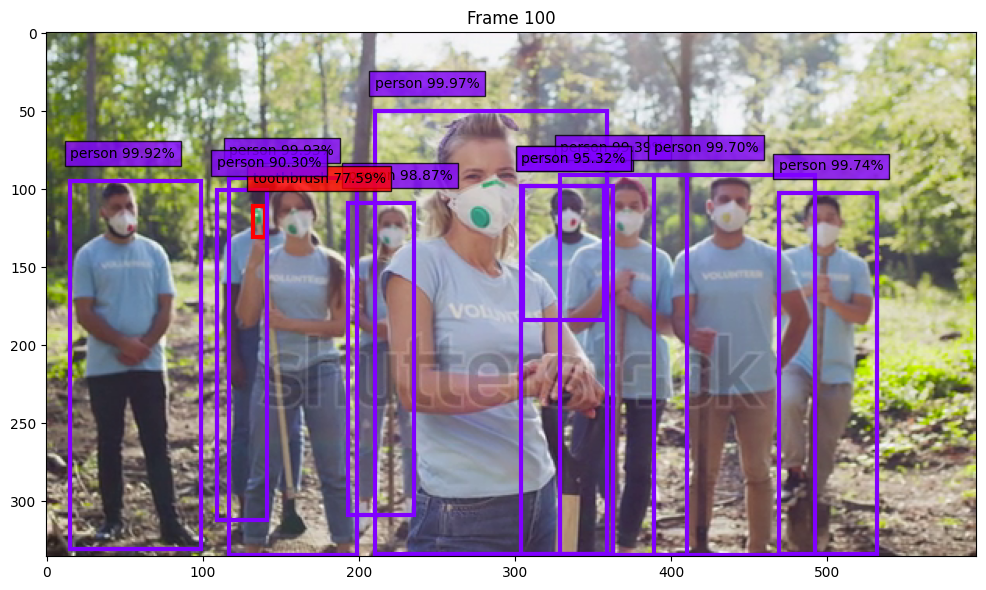

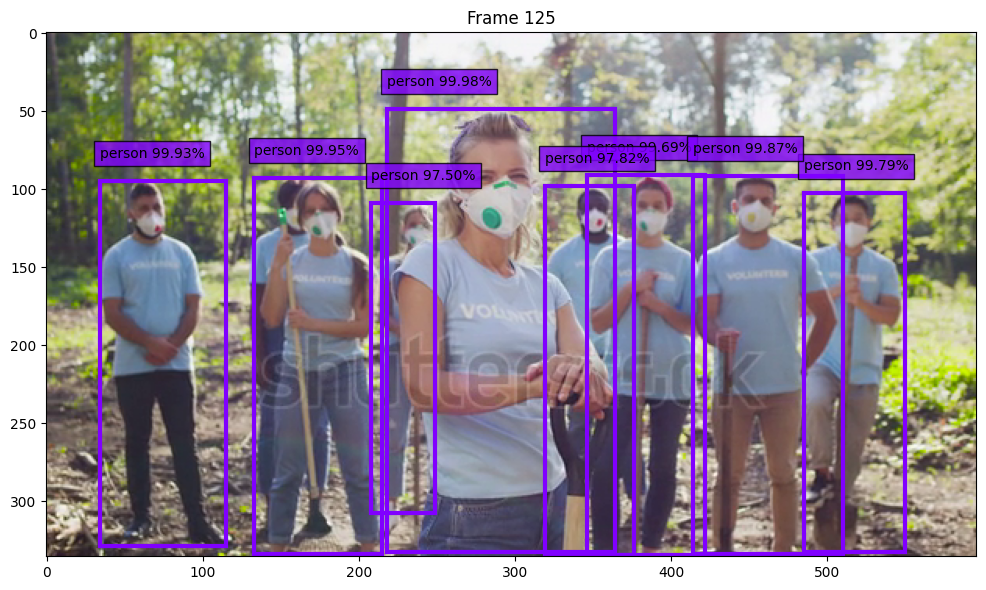

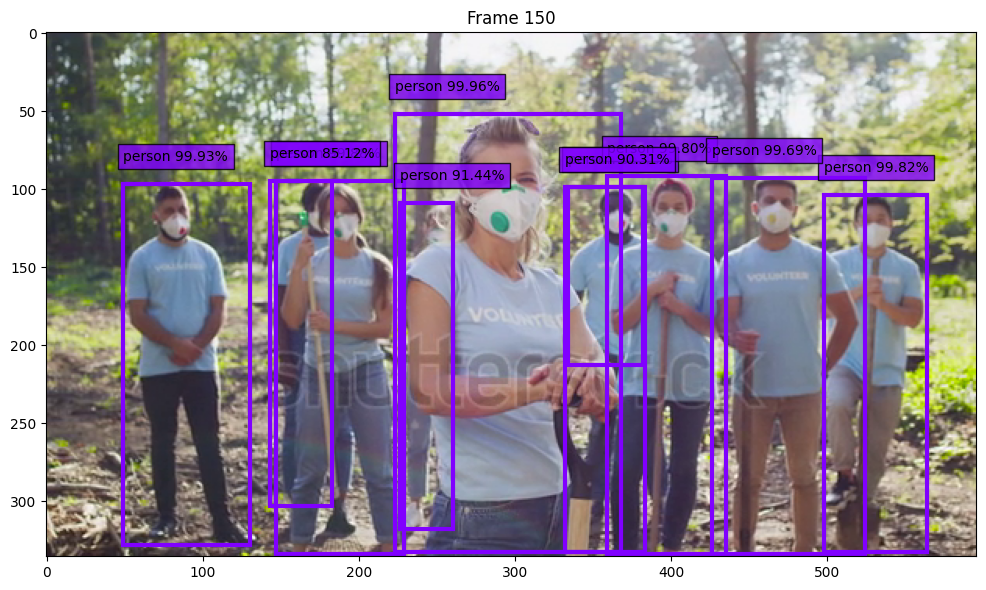

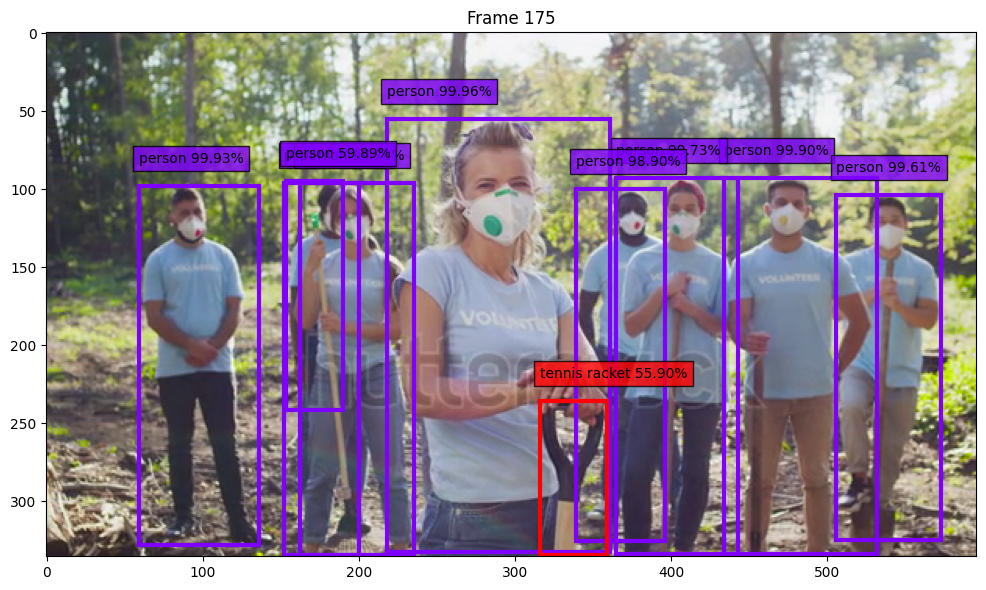

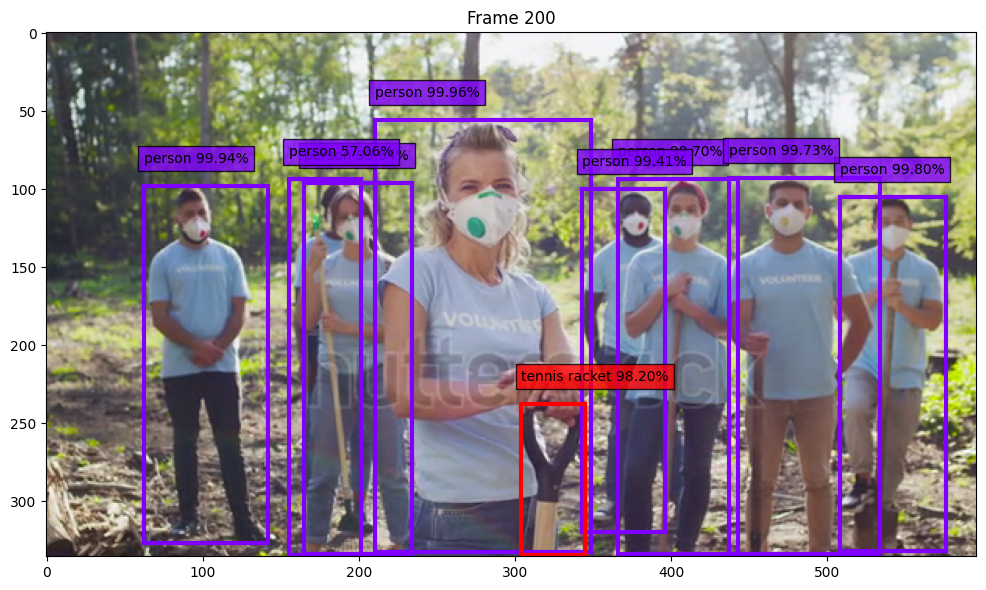

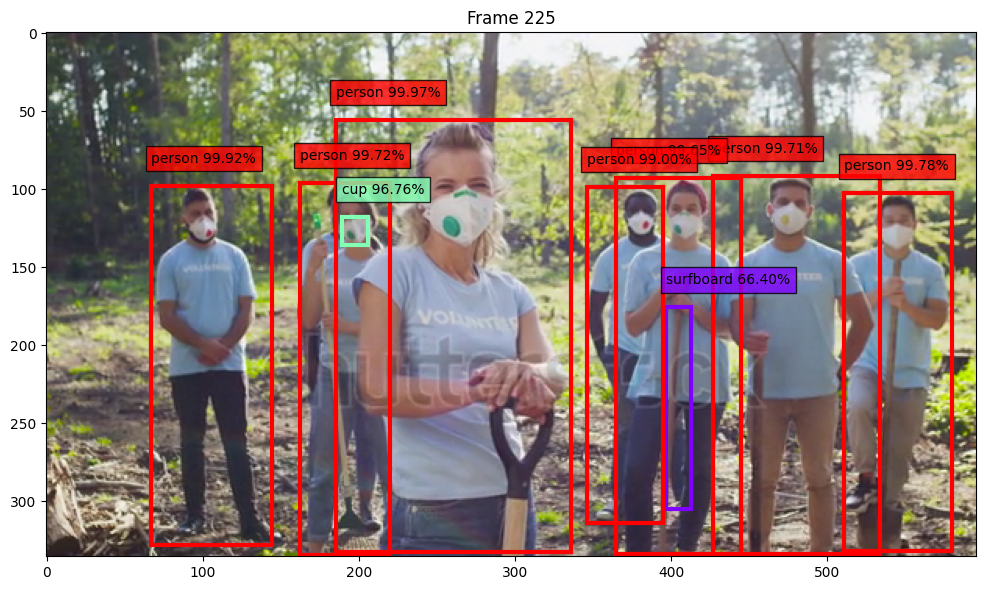

In [13]:
import cv2 
import matplotlib.pyplot as plt 
from matplotlib import patches, colormaps

import numpy as np 
from PIL import Image 

def cv2_to_pillow(array):
    array = cv2.cvtColor(array, cv2.COLOR_BGR2RGB)
    return Image.fromarray(array)


def plotar_deteccao(imagem, deteccao, colormap='viridis'):
    labels = {det['label'] for det in deteccao}
    indices_cor = np.linspace(0, 1, len(labels))
    cores = [colormaps.get_cmap(colormap)(x) for x in indices_cor]
    cores = dict(zip(labels, cores))
    
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(imagem)
    
    for det in deteccao:
        box = det['box']
        cor = cores[det['label']]
        origem = (box['xmin'], box['ymin'])
        largura = box['xmax'] - box['xmin']
        altura = box['ymax'] - box['ymin']
        
        rect = patches.Rectangle(origem, largura, altura, linewidth=3, edgecolor=cor, facecolor='none')
        ax.add_patch(rect)

        texto = f"{det['label']} {100 * det['score']:.2f}%"
        ax.text(box['xmin'], box['ymin'] - 15, texto, bbox={'facecolor': cor, 'alpha': 0.8})
    return ax

idx_video = 1

linha_video = [
	li 
	for i, li in enumerate(dados.take(20))
	if i == idx_video
]
if linha_video:
    dados_linha = linha_video[0]
    url = dados_linha['videourl']
    fps = int(dados_linha['framerate'])
    frame_count = 0 
    print(f"Detectando objetos no vídeo: {url}")
    captura = cv2.VideoCapture(url)
    sucesso, frame = captura.read() 
    
    while sucesso:
        imagem = cv2_to_pillow(frame)
        if frame_count % fps == 0:
            deteccao = detector(imagem)
            ax = plotar_deteccao(imagem=imagem, deteccao=deteccao, colormap='rainbow')
            ax.set_title(f"Frame {frame_count}")
        sucesso, frame = captura.read() 
        frame_count += 1
    plt.show()
        